Matheus do Ó Santos Tiburcio

---
#Introdução

Esse trabalho visa tentar prever a posição de uma partícula em um dado instante de tempo, aqui foco na posição no instante final de tempo. A movimentação da partícula nesse contexto é ditada por uma equação de movimento estocástica: Uma equação diferencial ordinária com parte estocástica.

Em partícular, utilizo a equação de Langevin que será comentada mais detalhadamente depois.


##Ideia de como encontrar

A ideia seria aplicar o método de Monte Carlo que consiste basicamente em repetir um experimento aleatório inúmeras a fim de encontrar um "padrão" no comportamento do sistema.

Nesse caso, tento resolver a equação de langevin inúmeras vezes com a mesma condição inicial e busco uma média da posição dessas inúmeras iterações. Comentarei mais em detalhes posteriormente.

---
#Equação de Langevin

A equação de Langevin é uma equação estocástica, ou seja, tem parte "aleatória" e descreve movimentos de partículas. Ela é dada por:

$m\frac{dv}{dt} = -γv + F + η(t)$, onde:

$m$: massa<br/>
$v$: velocidade da partícula<br/>
$t$: tempo<br/>
$γ$: coeficiente de atrito<br/>
$F$: força externa<br/>
$η(t)$: força aleatória ou ruído térmico<br/>
$m\frac{dv}{dt}$: variação da quantidade de movimento<br/>
$-γv$: força de arrasto<br/>

dependendo da cara do ruído térmico e das forças externas a solução para essa equação pode variar. Se, por exemplo, o ruído térmico for o ruído branco e as forças externas simples, é possível resolvê-la analiticamente. Para casos mais complexos pode-se recorrer para métodos numéricos.

Essa equação pode comportar um sistema, analisando diferentes variações de movimento. Nesse caso, cada variação pode ter sua própria força de arrasto, ruído térmico e forças externas:

$\begin{cases}
\frac{du}{dt} = -γ_{1}v + F_{1} + η_{1}(t) \\
\frac{dv}{dt} = -γ_{2}v + F_{2} + η_{2}(t) \\
\frac{dw}{dt} = -γ_{3}v + F_{3} + η_{3}(t)
\end{cases}$

Dentre métodos possíveis de resoluções desse tipo de equação estão os métodos de Runge-Kutta.


In [ ]:
import numpy as np
from scipy.integrate import odeint
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML

In [ ]:
class Particula:
  def __init__(self, x, y, z = 0):
    self.x = x
    self.y = y
    self.z = z

---
#Simulações únicas:

Essa parte inicial serve somente para demonstrar a ideia de como resolvo o sistema de Langevin. O método utilizado é o método de Heun, também podendo ser conhecido como "método de Runge-Kutta de 2ª ordem" ou até mesmo como "método de Euler-melhorado". Esse método não é o mais preciso de todos, porém é rápido e possui uma precisão aceitável. A cara deste método é a apresentada abaixo:

###$t_{i} = t_{0} + ih$<br/>
###$k_{1} = hf(t_{i}, y_{i})$<br>
###$k_{2} = hf(t_{i} + \frac{h}{2}, y_{i} + \frac{k_{1}}{2})$<br>
###$y_{i + 1} = y_{i} + k_{2}$<br>

$f(t, y) = \frac{dy}{dt}$(1)<br/>

Onde $t_{i}$ é um intervalo de tempo entre as $h$ divsões feitas. São feitas divisões igualmente espaçadas por esse método trabalhar com intervalos discretos e não contínuos. A ideia então é prever um $y$ futuro com base em um tempo pré-calculado ($t_{i}$ nesse caso). Ele é utilizado para solucionar equações diferenciais com a cara apresentada em (1). A precisão desse método depende do tamanho do passo $h$ escolhido.

No algoritmo que implemento não utilizo esta notação de $k$, porém é equivalente.

Adicional à isso, importante comentar a natureza das funções $u$ e $v$:


##Funções $u$:

As funções $u$ representam a parte determinística da equação e cada coordenada (Nesse caso $x$, $y$ e $z$) possui sua própria função determinística.

##Funções $v$:

As funções $v$ representam a parte estocástica que nesse caso basicamente é um número aleatório gerado com uma distribuição normal de média $μ = 0$ e desvio padrão $σ = 1$. Semelhante às funções $u$, cada coordenada possui sua própria função $v$.

Me baseei no código em aula para determinar uX e uY, todavia poderiam ser quaisquer funções.


In [ ]:
def uX(t):
    return np.sin(2 * np.pi * t)
def uY(t):
    return np.cos(2 * np.pi * t)
def uZ(t):
    return np.sin(2 * np.pi * t)
def vX(t):
    return np.random.normal(0, 1)
def vY(t):
    return np.random.normal(0, 1)
def vZ(t):
    return np.random.normal(0, 1)

def langevin(x, t):
  dxdt = uX(t) + vX(t)
  dydt = uY(t) + vY(t)

  x = np.array([dxdt, dydt])
  return x

def langevin3d(x, t):
  dxdt = uX(t) + vX(t)
  dydt = uY(t) + vY(t)
  dzdt = uZ(t) + vZ(t)

  x = np.array([dxdt, dydt, dzdt])
  return x

def heun(f, x0, t0, tf, N):
  t = [t0]
  x = [x0]

  dt = (tf - t0)/N

  tn = t0
  xn = x0

  for i in range(N):
    xE = xn + dt * f(xn, tn)
    xn = xn + (dt/2) * (f(xn, tn) + f(xE, tn + dt))
    tn = t0 + (i+1) * dt

    x.append(xn)
    t.append(tn)

  return [x, t]

---
## Pequeno exemplo em $R^{2}$

Aqui crio uma simulação de uma única iteração de solução do sistema. Apenas para demonstrar o comportamento aleatório do sistema. No gráfico à esquerda é plotado a posição $x$ em verde e a posição $y$ em vermelho ambas no eixo $y$ ao decorrer do tempo $t$ no eixo $x$.

À direita, em preto, é representada a posição da partícula no espaço sendo o eixo $x$ a posição $x$ atual da partícula e no eixo $y$ a posição $y$ atual da partícula.

In [ ]:
#condicoes iniciais
p0 = np.array([0, 0])
ti = 0
tf = 10
N = 100

dados, t = heun(langevin, p0, ti, tf, N)

def anima(i):
  ax["a"].clear()
  ax["b"].clear()

  ax["a"].plot(t[:i], lx[:i], color="green")
  ax["a"].plot(t[:i], ly[:i], color="red")
  ax["b"].plot(lx[:i], ly[:i], color="black")

  if(i > 0):
    ax["a"].scatter(t[i-1], lx[i-1], color="green")
    ax["a"].scatter(t[i-1], ly[i-1], color="red")
    ax["b"].scatter(lx[i-1], ly[i-1], color="black")
  else:
    ax["a"].scatter(t[i], lx[i], color="green")
    ax["a"].scatter(t[i], ly[i], color="red")
    ax["b"].scatter(lx[i], ly[i], color="black")


  ax["a"].legend(["posição x", "posição y"])
  ax["a"].set_xlabel("t")
  ax["a"].set_ylabel("posição")
  ax["a"].grid(True)

  ax["a"].legend(["trajetória da partícula"])
  ax["b"].set_xlabel("x")
  ax["b"].set_ylabel("y")
  ax["b"].grid(True)


lx = []
ly = []
for momento in dados:
  lx.append(momento[0])
  ly.append(momento[1])

fig = plt.figure(figsize=(10,6))
mosaico = """
          ab
          """

ax = fig.subplot_mosaic(mosaico)


anim = animation.FuncAnimation(fig, anima, frames=len(t)+1,
                               interval=200, repeat_delay=1000, blit=False)
rc('animation', html='jshtml')
plt.close()
anim

---
##Exemplo com duas partículas com mesma condição inicial

Aqui já dou um indício de que, mesmo iniciando no mesmo ponto, as trajetórias distoam consideravelmente com o passar do tempo. Os plots abaixo explicitam isso.

Nos gráficos à esquerda, as cores azuis representam a posição $x$ da partícula e as cores amarelas a posição em $y$ da partícula. O eixo $y$ é referente à essas posições e o eixo $x$ é referente ao tempo.

No gráfico à direita é representada a trajetória no espaço de ambas as partículas. A trajetória da primeira partícula é representada em preto e da segunda em laranja. Adicional à isso, o ponto vermelho representa a posição final da partícula 1 e o ponto azul a posição final da partícula 2.

Text(0, 0.5, 'y')

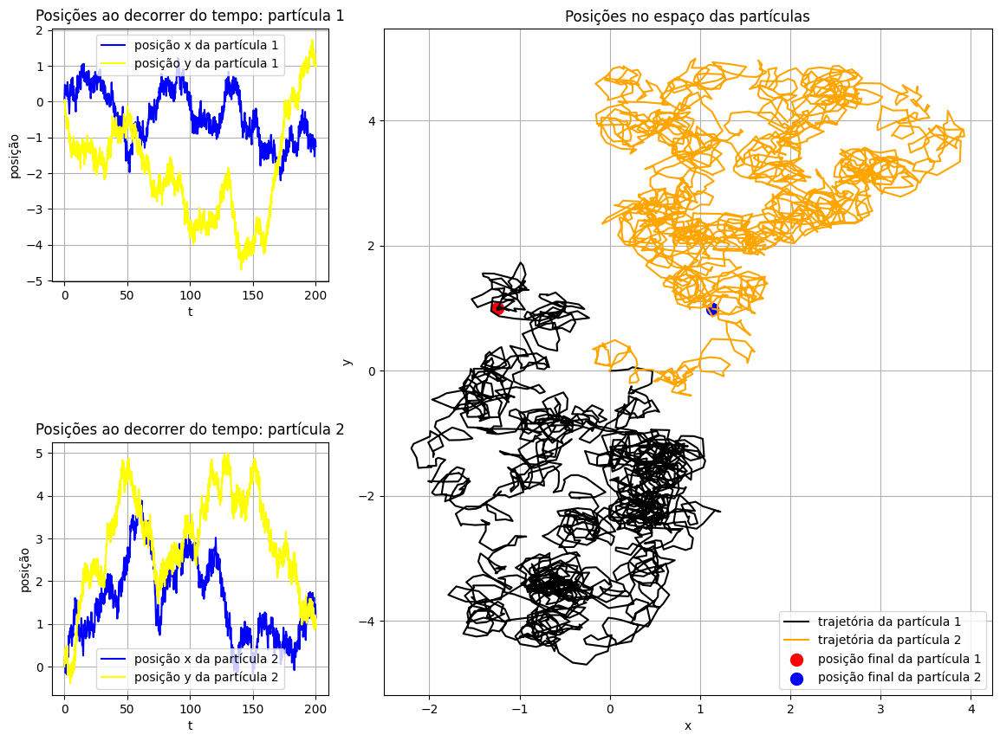

In [ ]:
#condicoes iniciais
p0 = np.array([0, 0])
ti = 0
tf = 200
N = 200*10

ps = [Particula(0, 0), Particula(0, 0)]

fig = plt.figure(figsize=(14,10))
mosaico = """
          acc
          acc
          .cc
          bcc
          bcc
          """

ax = fig.subplot_mosaic(mosaico)
ax["a"].grid(True)
ax["b"].grid(True)
ax["c"].grid(True)


dados, t = heun(langevin, np.array([ps[0].x, ps[0].y]), ti, tf, N)

lx = []
ly = []
for momento in dados:
  lx.append(momento[0])
  ly.append(momento[1])

ax["a"].plot(t, lx, color="blue")
ax["a"].plot(t, ly, color="yellow")
ax["c"].plot(lx, ly, color="black")

#variável auxiliar para escrever o ponto final no fim
#do plot(para a trajetoria da 2a partícula não passar por cima dele)
posicaoFinal = [lx[-1], ly[-1]]

dados, t = heun(langevin, np.array([ps[1].x, ps[1].y]), ti, tf, N)

lx = []
ly = []
for momento in dados:
  lx.append(momento[0])
  ly.append(momento[1])

ax["b"].plot(t, lx, color="blue")
ax["b"].plot(t, ly, color="yellow")
ax["c"].plot(lx, ly, color="orange")


ax["c"].scatter(posicaoFinal[0], posicaoFinal[1], color="red", s=100)
ax["c"].scatter(lx[-1], ly[-1], color="blue", s=100)

ax["a"].set_title("Posições ao decorrer do tempo: partícula 1")
ax["a"].legend(["posição x da partícula 1", "posição y da partícula 1"])
ax["a"].set_xlabel("t")
ax["a"].set_ylabel("posição")

ax["b"].set_title("Posições ao decorrer do tempo: partícula 2")
ax["b"].legend(["posição x da partícula 2", "posição y da partícula 2"])
ax["b"].set_xlabel("t")
ax["b"].set_ylabel("posição")

ax["c"].set_title("Posições no espaço das partículas")
ax["c"].legend(["trajetória da partícula 1", "trajetória da partícula 2", "posição final da partícula 1", "posição final da partícula 2"])
ax["c"].set_xlabel("x")
ax["c"].set_ylabel("y")

---
##Pequeno exemplo em $R^{3}$

Abaixo há um exemplo semelhante ao anterior, porém em $R^{3}$. Duas partículas são iniciadas na mesma posição espacial e suas trajetórias são cálculadas.

No gráfico há a trajetória no espaço de ambas as partículas. A trajetória da primeira partícula é representada em preto e da segunda em laranja. Adicional à isso, o ponto vermelho representa a posição final da partícula 1 e o ponto azul a posição final da partícula 2.

Isso é uma pequena demonstração (mas não prova) de que esse comportamento aleatório se segue para dimensões maiores, todavia este trabalho focará no caso em $R^{2}$.

Text(0.5, 0, 'z')

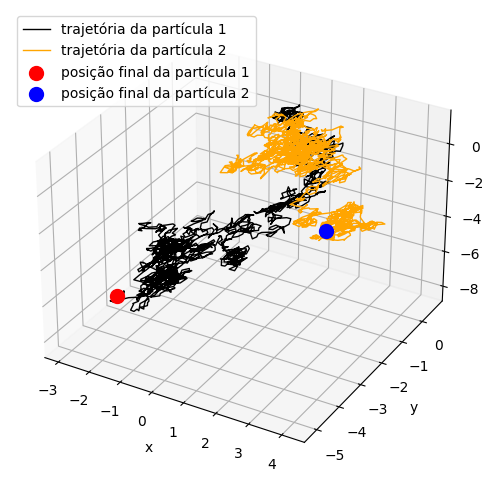

In [ ]:
ti = 0
tf = 200
N = 200*10

ps = [Particula(0, 0), Particula(0, 0)]

fig = plt.figure(figsize=(10,6))
ax = fig.add_subplot(projection = "3d")

lx = []
ly = []
lz = []
p0, t = heun(langevin3d, np.array([ps[0].x, ps[0].y, ps[0].z]), ti, tf, N)
for p in p0:
  lx.append(p[0])
  ly.append(p[1])
  lz.append(p[2])

ax.plot(lx, ly, lz, linewidth = 1, color = "black")

#var auxiliar para escrever o ponto final no fim
#do plot(para a trajetoria da 2a partícula não passar por cima dele)
posicaoFinal = [lx[-1], ly[-1], lz[-1]]

lx = []
ly = []
lz = []
p1, t = heun(langevin3d, np.array([ps[1].x, ps[1].y, ps[1].z]), ti, tf, N)
for p in p1:
  lx.append(p[0])
  ly.append(p[1])
  lz.append(p[2])

ax.plot(lx, ly, lz, linewidth = 1, color = "orange")

ax.scatter(posicaoFinal[0], posicaoFinal[1], posicaoFinal[2], color="red", s=100)
ax.scatter(lx[-1], ly[-1], lz[-1], color="blue", s=100)

ax.legend(["trajetória da partícula 1", "trajetória da partícula 2", "posição final da partícula 1", "posição final da partícula 2"])
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")

---
#Previsão de posição final aproximada da partícula

##Breve discussão

Aqui discuto a parte principal do trabalho apresentada na introdução: Buscar prever a posição final da partícula no espaço.

O sistema em questão é um sistema estocástico, então comportamentos como os já mostrados acima podem ocorrer, dada a mesma condição inicial, a posição final pode diferir. Para corrigir esse erro utilizarei a ideia da Lei dos Números Grandes e o método de Monte Carlo.

##Lei dos Grandes Números (LGN)

É um teorema da teoria de probabilidade. Essa lei diz que, dada sucessivas realizações do mesmo experimento, a média aritimética dessas realizações se aproximará da média ou valor esperado do real do experimento. A quantidade de realizações necessárias para se obter um resultado satisfatório (e faltaria se definir o que "satisfatório" significaria) pode variar. De fato, há formas de se estimar esse número, mas isso entra em outro escopo que não abordarei neste trabalho.

##Método de Monte Carlo

O método de Monte Carlo se aproveita da LGN para adquirir dados confiáveis e verdadeiros em dado sistema. A ideia basicamente consiste em realizar um experimento aleatório inúmeras vezes a fim de se obter dados condizentes e "verdadeiros" daquele dado sistema. É de extrema importância saber à que pergunta se quer responder a fim de realizar simulações que de fato entregue o que se queira.

---
##Aplicação na previsão da posição

Como não cálculo explicitamente o número de simulações do experimento necessárias para me aproximar da média verdadeira, irei simular o sistema extensivamente até que o intervalo da média dos resultados se afunile cada vez mais.

O processo será bem simples, iniciarei várias partículas com mesma posição inicial e determinarei a média de posição final delas, esboçarei abaixo um breve exemplo com o intuito de tornar essa ideia um pouco mais intuitiva:

###iteração 1:

####->Se obtém a posição final da 1ª partícula.

####->A posição final da 1º partícula é adicionada em uma lista.

####->Se calcula a média das posições finais atuais. Neste caso a média seria esta posição final dividida por 1, logo a própria posição final.

###iteração 2:

####->Se obtém a posição final da 2ª partícula.

####->A posição final da 2º partícula é adicionada em uma lista.

####->Se calcula a média das posições finais atuais:

posição final da 1ª partícula = $p_{1}$
posição final da 2ª partícula = $p_{2}$

###$\frac{p_{1} + p_{2}}{2}$

Seguindo esse padrão:


###iteração $n$:

####->Se obtém a posição final da nª partícula.

####->A posição final da nº partícula é adicionada em uma lista.

####->Se calcula a média das posições finais atuais:

###$M_{n} = \frac{\sum_{i = 1}^{n}p_{i}}{n}$, onde:

$M_{n}$: Média da posição final das n-ésimas primeiras partículas<br/>
$p_{i}$: posição final da i-ésima partícula

Em meu algoritmo determinei uma média para a coordenada x do ponto, nomearei de $M_{n}^{x}$ e uma coordenada para y do ponto, $M_{n}^{y}$.

O algoritmo só para quando $|M_{n}^{x} - M_{n-1}^{x}| < L$ e $|M_{n}^{y} - M_{n-1}^{y}| < L$, onde L é definido previamente. No caso do exemplo abaixo utilizo $L = 0.0001$.

In [ ]:
ti = 0
tf = 200
N = 200*10
pNumber = 1000

def calculaPosicaoAproximada(p, lim):
  fig = plt.figure(figsize=(10,6))
  mosaico = """
            ab
            """

  ax = fig.subplot_mosaic(mosaico)
  ax["a"].grid(True)
  ax["b"].grid(True)

  lx = []
  ly = []
  mediasX = []
  mediasY = []
  lz = []

  iteracoes = 0

  while True:
    lp, t = heun(langevin, np.array([p.x, p.y]), ti, tf, N)
    #ax.scatter(lp[0][0], lp[0][1], lp[0][2], linewidth=1, color="black")
    lx.append(lp[-1][0])
    ly.append(lp[-1][1])
    mediaX = (lx@np.ones(len(lx)))/len(lx)
    mediaY = (ly@np.ones(len(ly)))/len(ly)
    mediasX.append(mediaX)
    mediasY.append(mediaY)
    iteracoes+=1

    if iteracoes != 1 and abs(mediaX - mediasX[-2]) < lim and abs(mediaY - mediasY[-2]) < lim:
      if(iteracoes > 1):
        print(mediasX[-2], abs(mediasX[-2] - mediasX[-1]), abs(mediaX - mediasX[-1]))
      break

  ax["a"].scatter(lx[:-1], ly[:-1], color="green")
  ax["a"].scatter(mediasX[-1], mediasY[-1], color="black")
  ax["b"].plot(range(1, iteracoes+1), mediasX, color="blue")
  ax["b"].plot(range(1, iteracoes+1), mediasY, color="green")

  ax["a"].set_xlabel("x")
  ax["a"].set_ylabel("y")
  ax["b"].set_xlabel("número de iterações")
  ax["b"].set_ylabel("média")

  ax["a"].legend(["posição final", "média da posição final"])
  ax["b"].legend(["média da posição x", "média da posição y"])

  return iteracoes, mediasX, mediasY

def printaPosFinal(iteracoes, pos):
  print(f"Com {iteracoes} iteracoes a posição final aproximada seria de: ({pos[0]}, {pos[1]})")

0.02694078077881608 5.257219026003762e-06 0.0


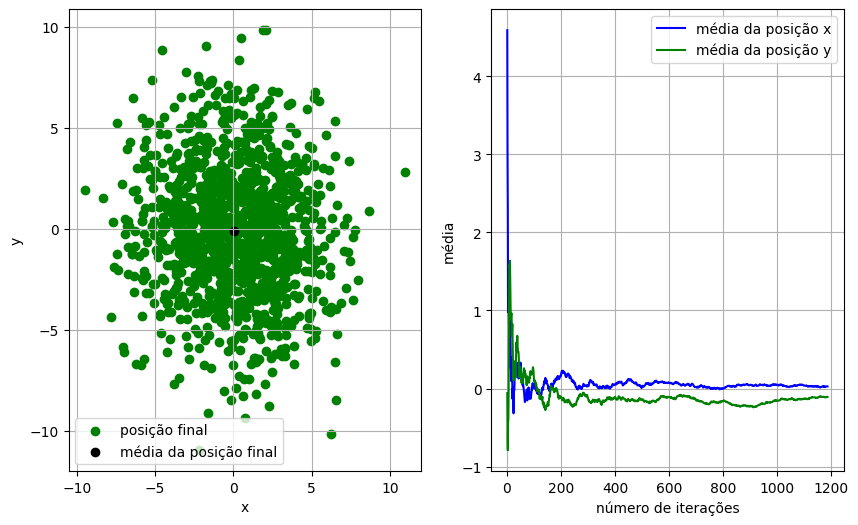

In [ ]:
iteracoes, mediasX, mediasY = calculaPosicaoAproximada(Particula(0, 0), 0.0001)
posicaoFinalAproximada = [mediasX[-1], mediasY[-1]]

In [ ]:
printaPosFinal(iteracoes, posicaoFinalAproximada)

Com 1186 iteracoes a posição final aproximada seria de: (0.026935523559790075, -0.10765621419196336)


---
##Discussão dos resultados

Repare no gráfico à direita que conforme mais iterações são feitas, menos as médias de posição (médias de x e de y) oscilam, parecem convergir para algum valor, penso que esse valor seria a "verdadeira" posição final da partícula. Isso é um reflexo da Lei dos Grandes Números. Curioso é o resultado dar próximo da posição inicial.

Se o desvio padrão for alterado, haverá um resultado mais distante da posição inicial:

abaixo faço vX utilizar de desvio padrão = $5$ e vY de desvio padrão = $0.1$. O desvio padrão parece ditar a itensidade da oscilação também.

-0.74317973205618 1.338671758766008e-05 0.0


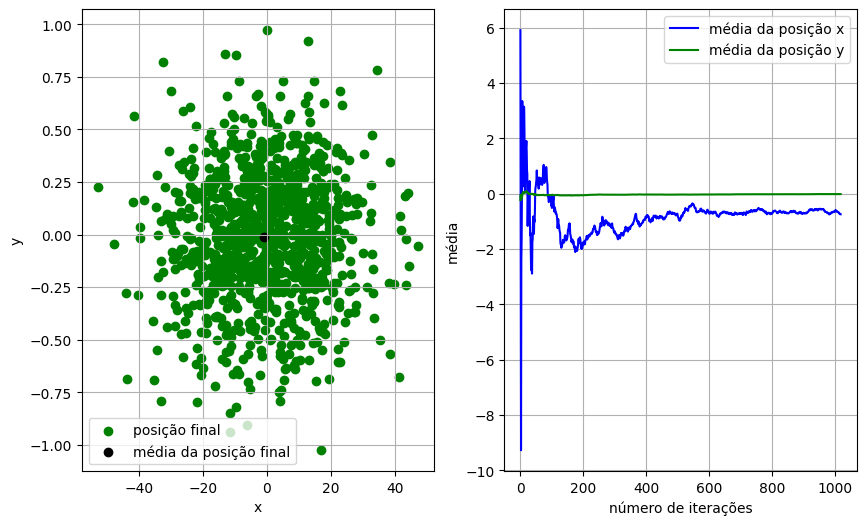

In [ ]:
def vX(t):
    return np.random.normal(0, 5)
def vY(t):
    return np.random.normal(0, 0.1)

iteracoes, mediasX, mediasY = calculaPosicaoAproximada(Particula(0, 0), 0.0001)
posicaoFinalAproximada = [mediasX[-1], mediasY[-1]]

In [ ]:
printaPosFinal(iteracoes, posicaoFinalAproximada)

Com 1017 iteracoes a posição final aproximada seria de: (-0.7431931187737677, -0.012337878118291212)


---
#Conclusões finais

A Lei dos Grandes Números e o método de Monte Carlo parecem de fato auxiliar na previsão da posição de uma partícula. Todavia não possuo conhecimento suficiente para saber o que a parte estocástica causa de fato no resultado final. Esse última declaração, portanto, seria algo que exigiria mais estudos.

Na parte de referências há uma chance de estar faltando algumas. Peço desculpas.

---
#Fontes:

https://en.wikipedia.org/wiki/Law_of_large_numbers<br/>
https://en.wikipedia.org/wiki/Monte_Carlo_method<br/>
https://en.wikipedia.org/wiki/Random_walk<br/>
https://en.wikipedia.org/wiki/Langevin_equation<br/>
https://en.wikipedia.org/wiki/Brownian_motion